<a href="https://colab.research.google.com/github/ElSayedMMostafa/Deep-learning-Tasks/blob/main/Lab_8%7CTime_Series_Forcasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 align="center">UST, Zewail City</h1>
<h2 align="center">CIE 555 (Spring 2021)</h2>
<h2 align="center">Lab 8 : Time Series Forecasting</h2>


> Student Name: **Elsayed Mohammed Mostafa** <br>
> Student ID  : **201700316** <br> 
> Supervised by: **Eng. Aya Alzahy**

Based on Tensorflow and Keras tutorials: 

https://www.tensorflow.org/tutorials/structured_data/time_series 

https://keras.io/examples/timeseries/timeseries_weather_forecasting/

#Lab Objectives

* Explore and process the weather time series data
* Understand the basic operations of RNN models and LSTM cells
* Use RNNs for time series forecasting

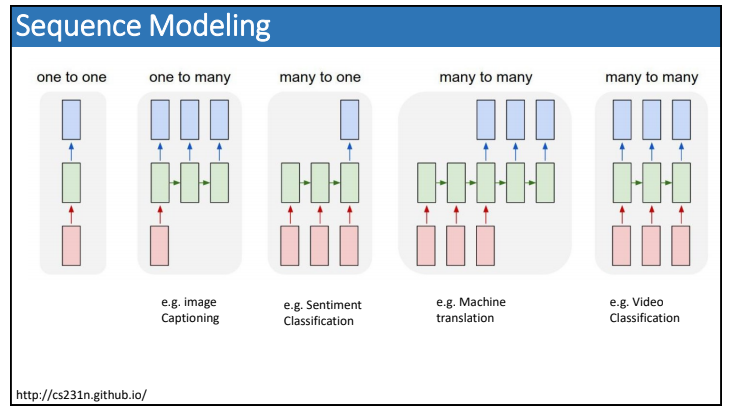

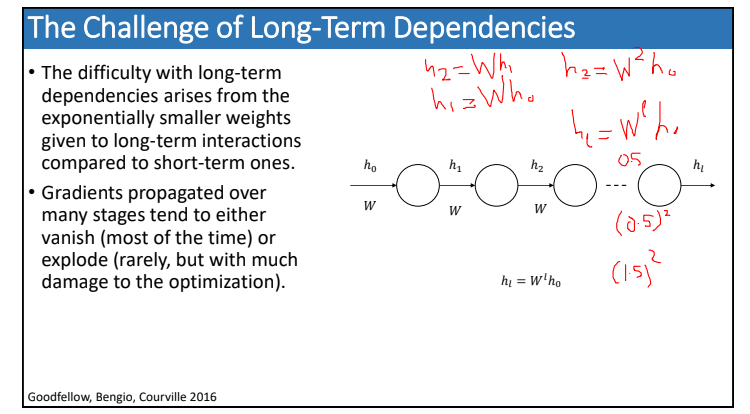

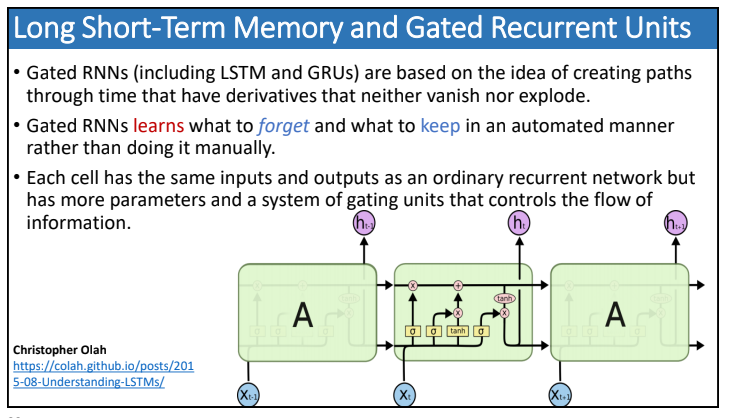

#Installation and Import statements

In [ ]:
!pip install pandas-profiling==2.7.1

In [ ]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import pandas_profiling as pp

from tensorflow import keras

from zipfile import ZipFile

# Help Functions


In [ ]:
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    
    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return

In [ ]:
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std

#Dataset

* In this lab we will work with the weather forecasting dataset.
* This dataset contains 14 different features such as air temperature, atmospheric pressure, and humidity. 
* These were collected every 10 minutes, beginning in 2003. 
* We will use only the data collected between 2009 and 2016. 

In [ ]:
uri = "https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip"
zip_path = keras.utils.get_file(origin=uri, fname="jena_climate_2009_2016.csv.zip")
zip_file = ZipFile(zip_path)
zip_file.extractall()
csv_path = "jena_climate_2009_2016.csv"

In [ ]:
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


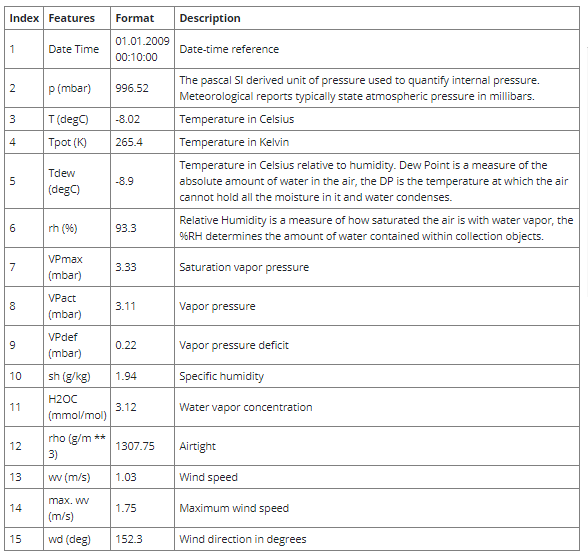

In [ ]:
#pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Data Cleaning and Feature Engineering

##Drop some of the highly correlated features

We'll drop the following features: 
* Tpot (K)
* Tdew (degC) 
* rh
* VPact (mbar)
* max. wv (m/s)
* H2OC 

In [ ]:
df= df.drop(columns=['Tpot (K)','Tdew (degC)','rh (%)','VPact (mbar)','max. wv (m/s)', 'H2OC (mmol/mol)'])
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,1.03,152.3
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,0.72,136.1
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,0.19,171.6
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,0.34,198.0
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,0.32,214.3


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,1.702224,65.446714,-9999.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Velocity Min Value

One thing that should stand out is the min value of the wind velocity, wv (m/s) column. This -9999 is likely erroneous. There's a separate wind direction column, so the velocity should be >=0. Replace it with zeros:

In [ ]:
bad_wv = df['wv (m/s)'] == -9999.0
df['wv (m/s)'][bad_wv] = 0.0
df.describe().transpose()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,2.130191,1.542334,0.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Direction

The last column of the data, wd (deg), gives the wind direction in units of degrees. Angles do not make good model inputs, 360° and 0° should be close to each other, and wrap around smoothly. It will be easier for the model to interpret if you convert the wind direction and velocity columns to a wind vector:
 

In [ ]:
wv = df.pop('wv (m/s)')

# Convert to radians.
wd_rad = df.pop('wd (deg)')*np.pi/180

# Calculate the wind x and y components.
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


In [ ]:
features= df.drop(columns='Date Time')
features.index=df['Date Time']
features.head()

,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
Date Time,,,,,,,,
01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


#Task 

Use two RNN models (one with simple vanilla RNN cells and the other with LSTM cells) to predict the temperature 24 hours into the future given the past 24 hours as illustrated in the below window: 

https://keras.io/api/layers/recurrent_layers/simple_rnn/

https://keras.io/api/layers/recurrent_layers/lstm/

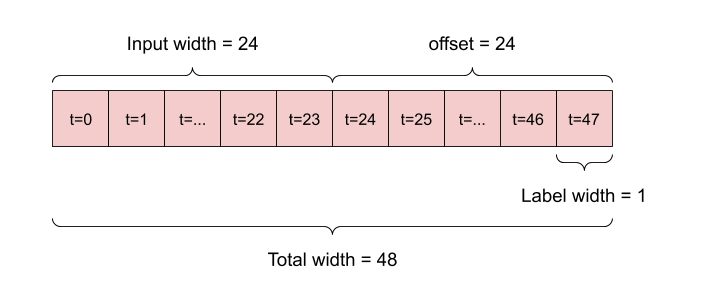

- In this task you're required to split the data into training, validation and test. Use the test set to test the generalization error of your models. 
- Use mean absolute error as an evaluation metric
- Compare the performance of the two models and comment on the results


## Splitting data

In [ ]:
train_split_fraction, val_split_fraction = 0.6, 0.2
train_split = int(train_split_fraction * int(df.shape[0]))
val_split = int(val_split_fraction * int(df.shape[0]))

print("Train split: ", train_split)
print("val_split: ", val_split)


features = normalize(features.values, train_split)
features = pd.DataFrame(features)
features.head()

Train split:  252330
val_split:  84110


,0,1,2,3,4,5,6,7
0,0.936300,-1.926586,-1.289421,-0.782276,-1.469070,2.159320,-0.171086,0.560272
1,0.942319,-1.970729,-1.302319,-0.784347,-1.487636,2.208436,0.025326,0.573328
2,0.937504,-1.982048,-1.304899,-0.786419,-1.491349,2.218978,0.190603,0.272493
3,0.935096,-1.959410,-1.298450,-0.788491,-1.476496,2.193821,0.122962,0.187747
4,0.935096,-1.954883,-1.297160,-0.788491,-1.476496,2.189269,0.152441,0.139726


In [ ]:
train_data = features.loc[0 : train_split -1]
val_data = features.loc[train_split:train_split+val_split - 1]
test_data = features.loc[train_split+val_split:]

print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)
print("Test data shape: ", test_data.shape)

Train data shape:  (252330, 8)
Validation data shape:  (84110, 8)
Test data shape:  (84111, 8)


In [ ]:
step = 6
past = 24*6
future = 24*6
learning_rate = 0.001
batch_size = 256
epochs = 15

In [ ]:
start = past + future
print("Start= ", start)
end = start + train_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  288
End=  252618
(252330, 8)
(252330, 1)
Sequence length=  24


In [ ]:
# Training data
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size
)

In [ ]:
# Vlidation data

x_end = len(val_data) - past - future

label_start = train_split + past + future
label_end = train_split + len(val_data)

x_val = val_data.iloc[:x_end].values
y_val = features.iloc[label_start:label_end][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size
)

In [ ]:
# Test data
x_end = len(test_data) - past - future

label_start = train_split + val_split + past + future

x_val = test_data.iloc[:x_end].values
y_val = features.iloc[label_start:][[1]]

dataset_test = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 24, 8)
Target shape: (256, 1)


## Training and Evaluation


### **LSTM**

***Model Creation and compilation***

In [ ]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="MeanAbsoluteError")
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 24, 8)]           0         
_________________________________________________________________
lstm (LSTM)                  (None, 32)                5248      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 5,281
Trainable params: 5,281
Non-trainable params: 0
_________________________________________________________________


***Model Fitting and Validation***

In [ ]:
path_checkpoint = "model_LSTM_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/15
986/986 [==============================] - 46s 43ms/step - loss: 0.3596 - val_loss: 0.3199

Epoch 00001: val_loss improved from inf to 0.31988, saving model to model_LSTM_checkpoint.h5
Epoch 2/15
986/986 [==============================] - 43s 44ms/step - loss: 0.3108 - val_loss: 0.2975

Epoch 00002: val_loss improved from 0.31988 to 0.29753, saving model to model_LSTM_checkpoint.h5
Epoch 3/15
986/986 [==============================] - 43s 44ms/step - loss: 0.3010 - val_loss: 0.2906

Epoch 00003: val_loss improved from 0.29753 to 0.29062, saving model to model_LSTM_checkpoint.h5
Epoch 4/15
986/986 [==============================] - 43s 44ms/step - loss: 0.2971 - val_loss: 0.2868

Epoch 00004: val_loss improved from 0.29062 to 0.28676, saving model to model_LSTM_checkpoint.h5
Epoch 5/15
986/986 [==============================] - 43s 43ms/step - loss: 0.2941 - val_loss: 0.2848

Epoch 00005: val_loss improved from 0.28676 to 0.28482, saving model to model_LSTM_checkpoint.h5
Epoc

***Model Evaluation***

In [ ]:
# Printing the test loss
model.evaluate(dataset_test)

327/327 [==============================] - 11s 32ms/step - loss: 0.2797


0.2796598970890045

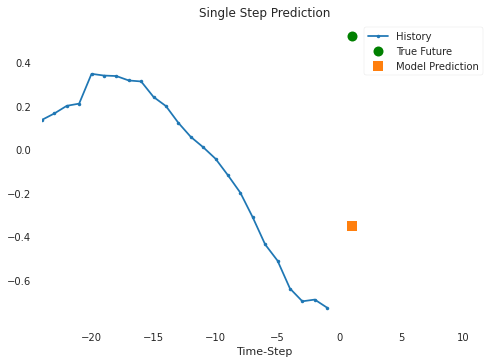

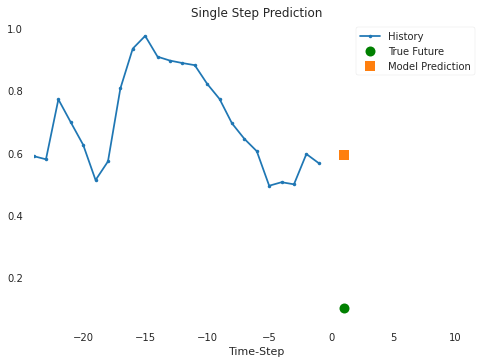

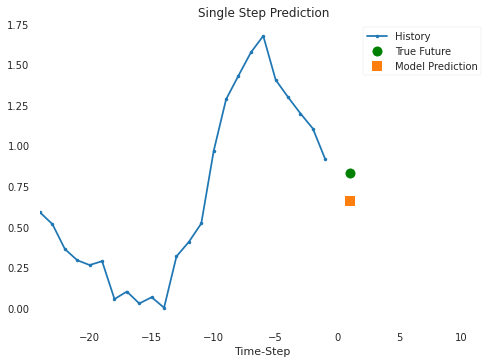

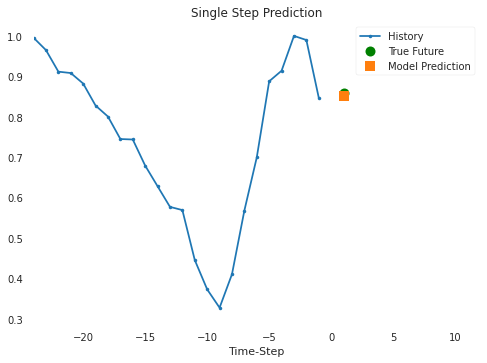

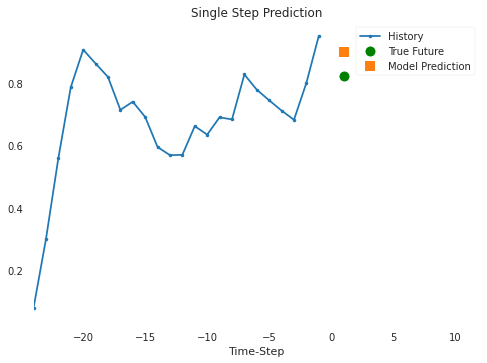

In [ ]:
# Visualizing the time series predection 
for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

***Loss Visulaization***

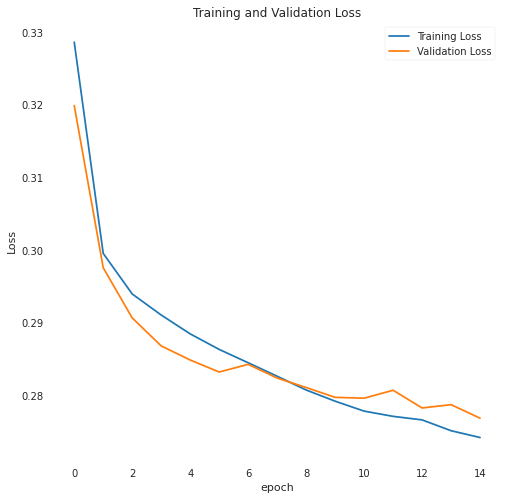

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Loss')
#plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### **RNN**

***Model Creation and compilation***

In [ ]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.SimpleRNN(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="MeanAbsoluteError")
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 24, 8)]           0         
_________________________________________________________________
simple_rnn (SimpleRNN)       (None, 32)                1312      
_________________________________________________________________
dense (Dense)                (None, 1)                 33        
Total params: 1,345
Trainable params: 1,345
Non-trainable params: 0
_________________________________________________________________


***Model Fitting and Validation***

In [ ]:
path_checkpoint = "model_RNN_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/15
986/986 [==============================] - 55s 55ms/step - loss: 0.4296 - val_loss: 0.3353

Epoch 00001: val_loss improved from inf to 0.33527, saving model to model_RNN_checkpoint.h5
Epoch 2/15
986/986 [==============================] - 54s 54ms/step - loss: 0.3148 - val_loss: 0.3246

Epoch 00002: val_loss improved from 0.33527 to 0.32465, saving model to model_RNN_checkpoint.h5
Epoch 3/15
986/986 [==============================] - 53s 54ms/step - loss: 0.3072 - val_loss: 0.3223

Epoch 00003: val_loss improved from 0.32465 to 0.32235, saving model to model_RNN_checkpoint.h5
Epoch 4/15
986/986 [==============================] - 54s 55ms/step - loss: 0.3042 - val_loss: 0.3142

Epoch 00004: val_loss improved from 0.32235 to 0.31420, saving model to model_RNN_checkpoint.h5
Epoch 5/15
986/986 [==============================] - 54s 55ms/step - loss: 0.3013 - val_loss: 0.3069

Epoch 00005: val_loss improved from 0.31420 to 0.30694, saving model to model_RNN_checkpoint.h5
Epoch 6/1

***Model Evaluation***

In [ ]:
# Printing the test loss
model.evaluate(dataset_test,return_dict=True)

327/327 [==============================] - 11s 33ms/step - loss: 0.3068


{'loss': 0.3067916929721832}

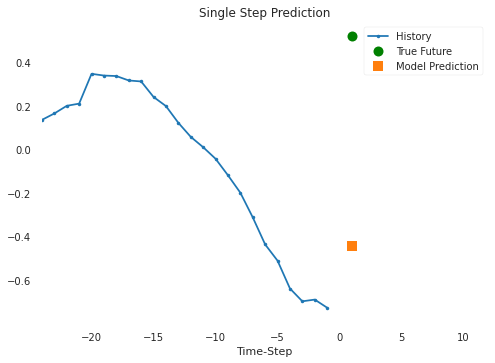

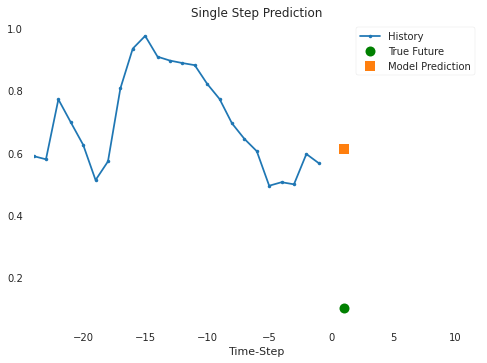

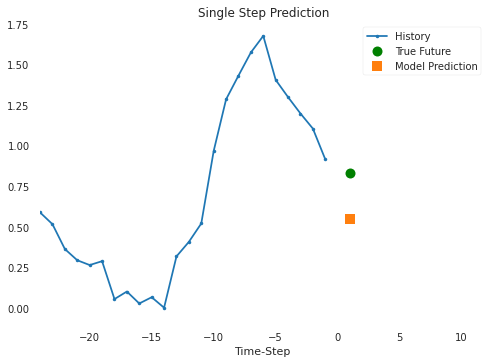

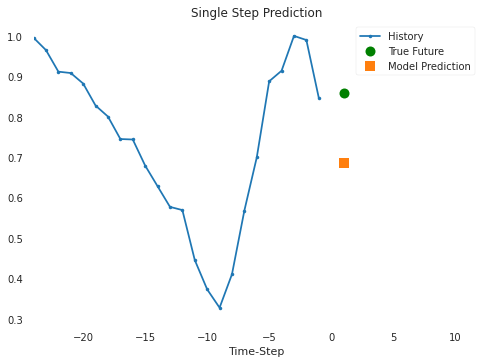

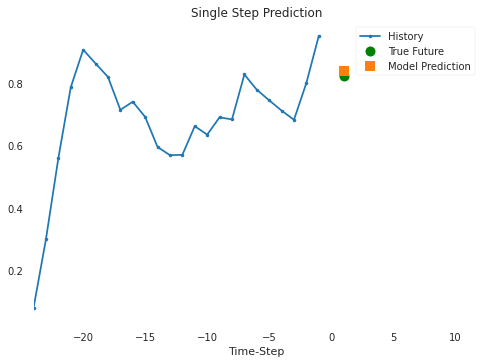

In [ ]:
# Visualizing the time series predection 
for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

***Loss Visualization***

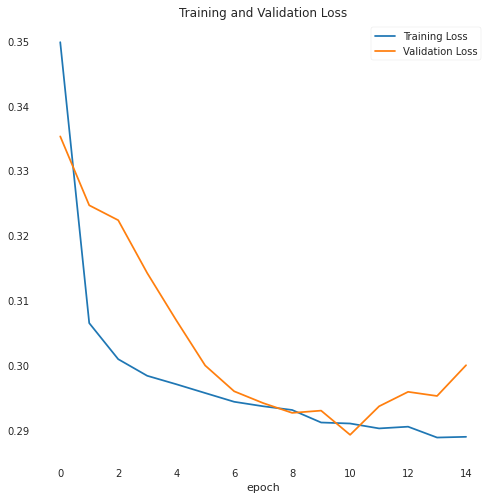

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Loss')
#plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### Models Comparison

* From the training and validation of hte 15 epochs, it's obvious that LSTM model is better that simple RNN model. LSTM resultant model has lower loss and it validation loss is is reduced faster. Moreover, the curve of losses in RNN model indicates that RNN model may overfit if more epochs are run.

### Bonus Question
- What does the return_sequences parameter mean in LSTM layer?  <br>
 - It's a boolean parameters decides whether to return the single value output of the last input in the input time series or return each output(prediction) for each single time step in the input time series. It's default value is False ( Returning the last output step (state) ) <br>
  - *Sources:* <br>
    1- https://machinelearningmastery.com/return-sequences-and-return-states-for-lstms-in-keras/ <br>
    2- https://keras.io/api/layers/recurrent_layers/lstm/ <br>